In [1]:
import rff

import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, Dataset
import os
import math
from tqdm.auto import tqdm

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time

def get_mgrid(sidelen, dim=2, device='cpu'):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen, device=device)])
    mgrid = torch.stack(torch.meshgrid(*tensors, indexing='ij'), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

import plotly.express as px
import pandas as pd

def to_np(t):
    a = t.detach().flatten().cpu().numpy()
    a = np.random.choice(a, size=1_000, replace=False)
    return a


def U(*shape):
    x = torch.rand(*shape)
    x = (x-0.5)*2.
    return x

import lovely_tensors as lt
lt.monkey_patch()

In [2]:
import os
import random
import numpy as np
import torch

def seed_all(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

In [3]:
# cfg

device = 'cuda:0'
seed_all(0)
# device = 'cpu'

# Dataset

In [4]:
from torch.utils.data import DataLoader, Dataset
import os

from PIL import Image
from torchvision.transforms import Resize, Compose, ToTensor, Normalize
import numpy as np
import skimage
import matplotlib.pyplot as plt

import time

def get_mgrid(sidelen, dim=2):
    '''Generates a flattened grid of (x,y,...) coordinates in a range of -1 to 1.
    sidelen: int
    dim: int'''
    tensors = tuple(dim * [torch.linspace(-1, 1, steps=sidelen)])
    mgrid = torch.stack(torch.meshgrid(*tensors), dim=-1)
    mgrid = mgrid.reshape(-1, dim)
    return mgrid

In [5]:
def get_cameraman_tensor(sidelength):
    img = Image.fromarray(skimage.data.camera())        
    transform = Compose([
        Resize(sidelength),
        ToTensor(),
        Normalize(torch.Tensor([0.5]), torch.Tensor([0.5]))
    ])
    img = transform(img)
    return img


class ImageFitting(Dataset):
    def __init__(self, sidelength):
        super().__init__()
        img = get_cameraman_tensor(sidelength)
        self.pixels = img.permute(1, 2, 0).view(-1, 1)
        self.coords = get_mgrid(sidelength, 2)

    def __len__(self):
        return 1

    def __getitem__(self, idx):    
        if idx > 0: raise IndexError
            
        return self.coords, self.pixels

In [6]:
cameraman = ImageFitting(256)
dataloader = DataLoader(cameraman, batch_size=1, pin_memory=True, num_workers=0)

/opt/conda/lib/python3.7/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [7]:
uvs, y = next(iter(dataloader))
uvs, y = uvs.to(device), y.to(device)

In [8]:
uvs, y

(tensor[1, 65536, 2] n=131072 x∈[-1.000, 1.000] μ=-3.725e-09 σ=0.580 cuda:0,
 tensor[1, 65536, 1] x∈[-0.976, 1.000] μ=0.013 σ=0.569 cuda:0)

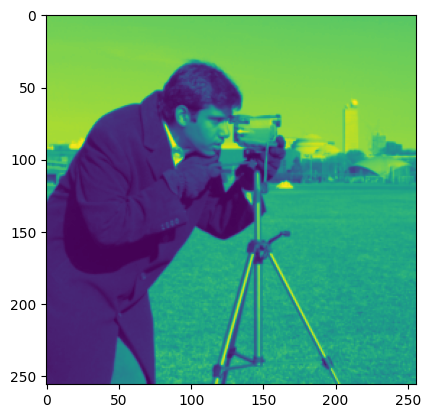

In [9]:
plt.imshow(y.cpu().reshape(256, 256))

In [10]:
def my_mse_loss(im_a, im_b, data_range=1): 
    data_range = 1.
    mse = F.mse_loss(im_a, im_b)
    psnr = 10 * torch.log10((data_range ** 2) / mse)
    return mse, psnr

# Training

In [11]:
# hyperparameters

siren_kwargs = {
    'in_features': 2,
    'out_features': 1,
    'hidden_features': 256,
    'hidden_layers': 3,
    'omega_0': 30
}

for key, value in siren_kwargs.items():
    globals()[key] = value

# Their results
# Step 490, Total loss 0.001014

# my results
# Step 490, Total loss 0.001010, PSNR=29.955465

```python
Siren(
  (net): Sequential(
    (0): SineLayer(
      (linear): Linear(in_features=2, out_features=256, bias=True)
    )
    (1): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (2): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (3): SineLayer(
      (linear): Linear(in_features=256, out_features=256, bias=True)
    )
    (4): Linear(in_features=256, out_features=1, bias=True)
  )
)
```

In [12]:
def init_linear_default(in_features, out_features):
    W = torch.randn(in_features, out_features)
    b = 1e-4 * torch.randn(out_features)
    return W.to(device), b.to(device)

def linear(in_features, out_features):
    return init_linear_default(in_features, out_features)


def forward(uvs, layers):
    h = uvs
    
    for i, (W, b) in enumerate(layers):
        h = h@W + b
        
        if i != len(layers) - 1:
            h = (omega_0*h).sin()
    return h

In [13]:
layers = [
    linear(in_features, hidden_features),
    *[linear(hidden_features, hidden_features) for _ in range(hidden_layers)],
    linear(hidden_features, out_features)
]

W, _ = layers[0]
W.uniform_(-1 / in_features, 1 / in_features)

for W, _ in layers[1:]:
    W.uniform_(-np.sqrt(6 / hidden_features) / omega_0, 
                                             np.sqrt(6 / hidden_features) / omega_0)
    
params = [p for l in layers for p in l]
for p in params:
    p.requires_grad_(True)

In [14]:
total_steps = 500 # Since the whole image is our dataset, this just means 500 gradient descent steps.
steps_til_summary = 10

  0%|          | 0/500 [00:00<?, ?it/s]

Step 0, Total loss 0.325091, PSNR=4.879957


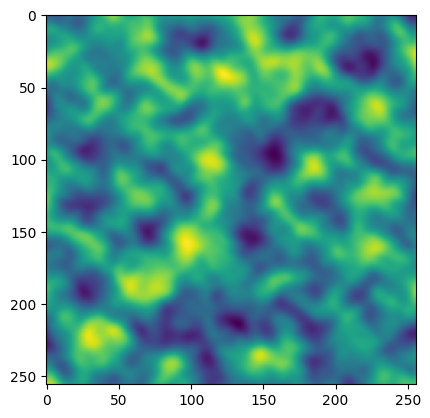

Step 10, Total loss 0.119420, PSNR=9.229237


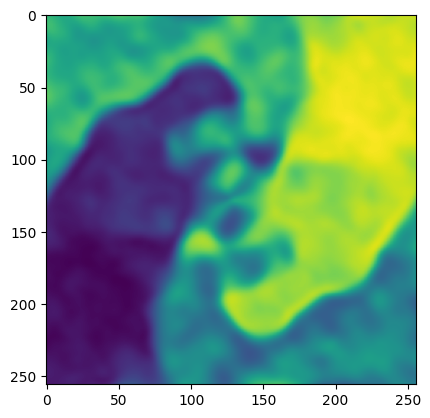

Step 20, Total loss 0.058675, PSNR=12.315465


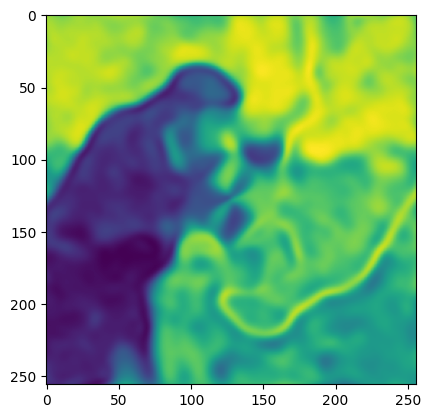

Step 30, Total loss 0.028507, PSNR=15.450558


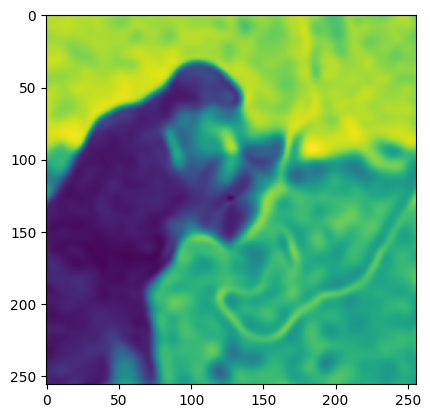

Step 40, Total loss 0.019032, PSNR=17.205128


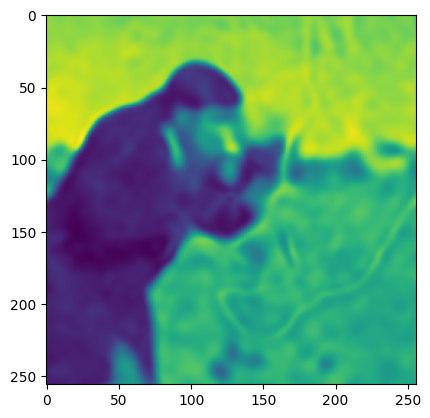

Step 50, Total loss 0.014868, PSNR=18.277342


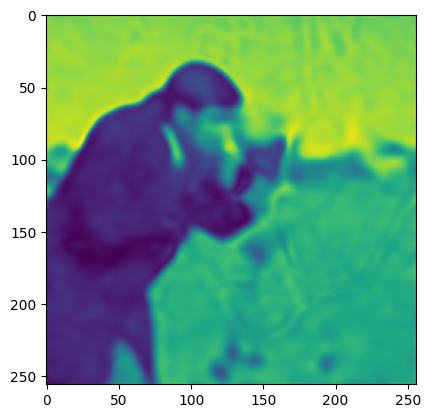

Step 60, Total loss 0.012727, PSNR=18.952736


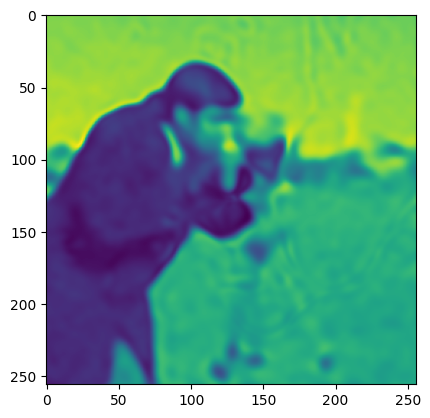

Step 70, Total loss 0.011397, PSNR=19.431976


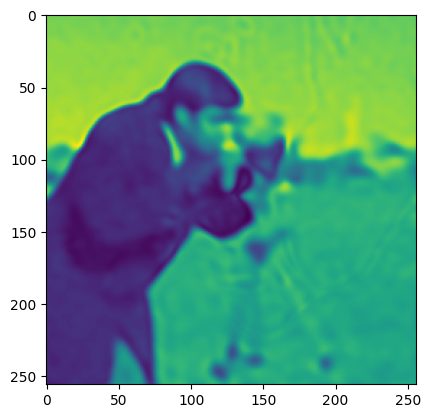

Step 80, Total loss 0.010458, PSNR=19.805449


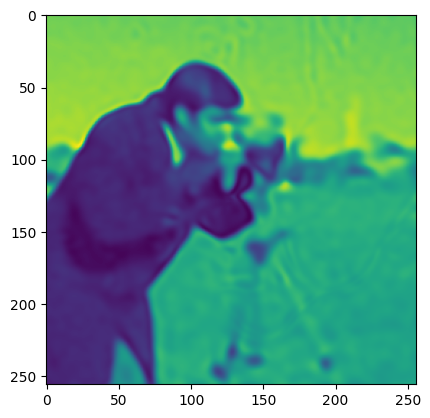

Step 90, Total loss 0.009720, PSNR=20.123344


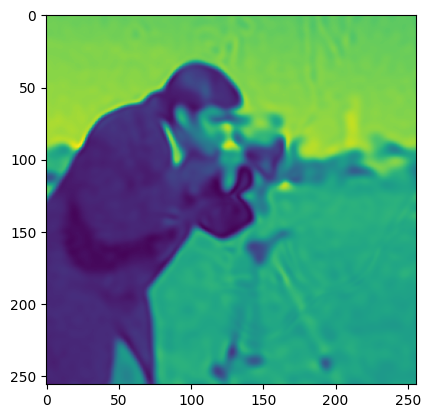

Step 100, Total loss 0.009087, PSNR=20.415813


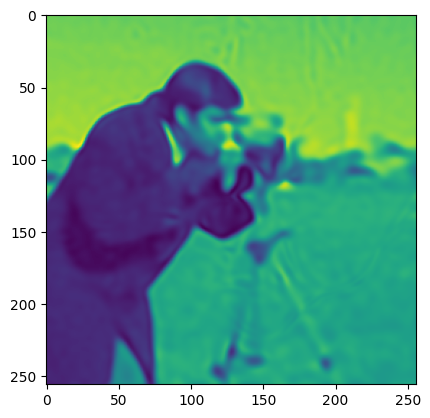

Step 110, Total loss 0.008522, PSNR=20.694818


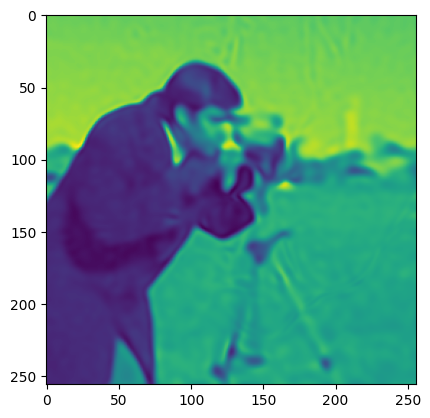

Step 120, Total loss 0.008001, PSNR=20.968821


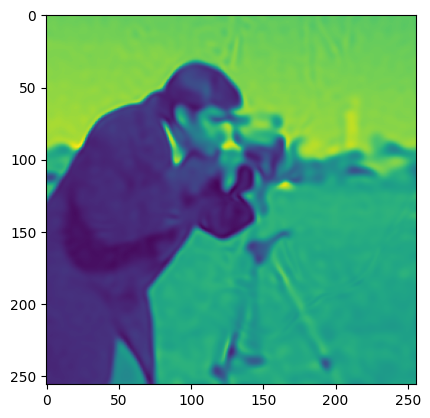

Step 130, Total loss 0.007513, PSNR=21.241615


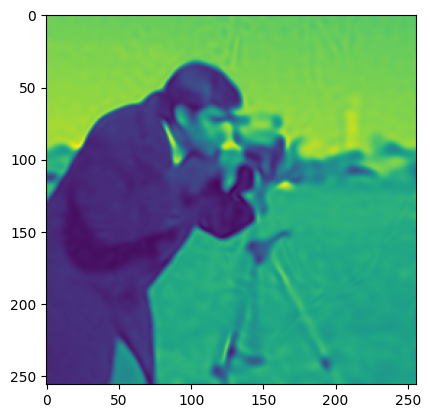

Step 140, Total loss 0.007056, PSNR=21.514177


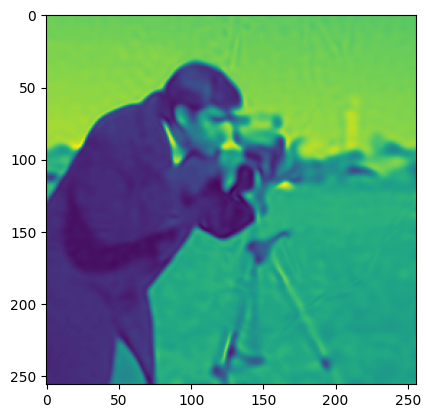

Step 150, Total loss 0.006626, PSNR=21.787296


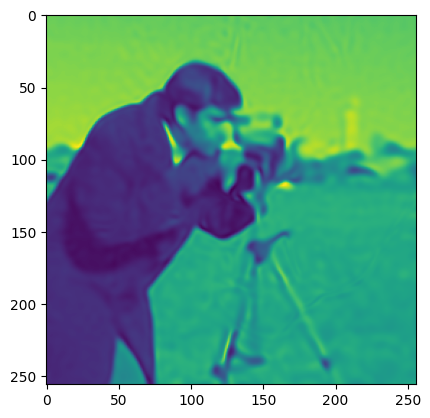

Step 160, Total loss 0.006553, PSNR=21.835354


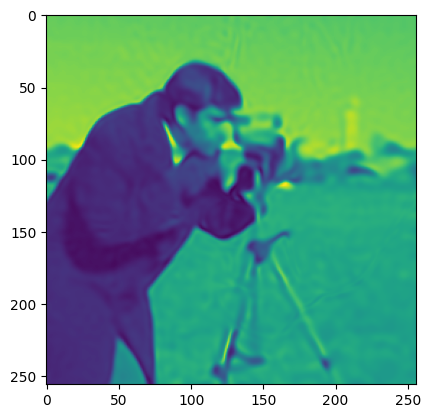

Step 170, Total loss 0.005903, PSNR=22.289259


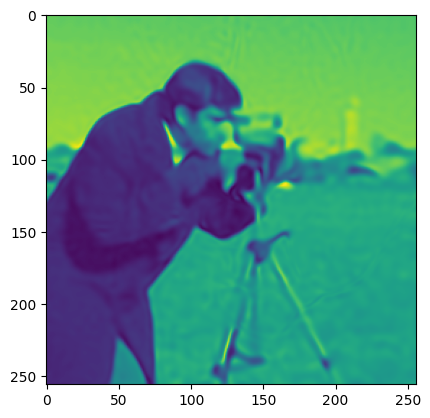

Step 180, Total loss 0.005513, PSNR=22.586411


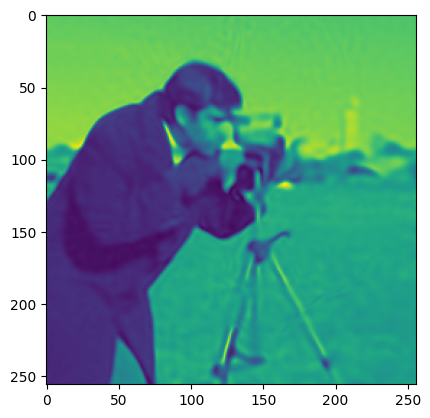

Step 190, Total loss 0.005155, PSNR=22.877510


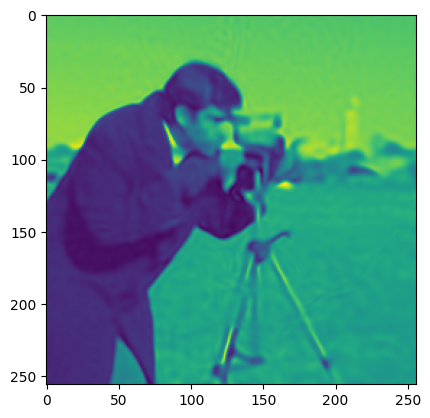

Step 200, Total loss 0.004813, PSNR=23.175739


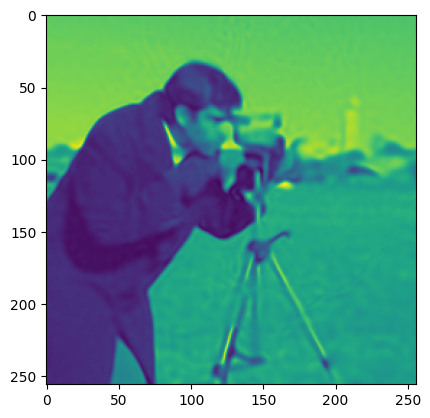

Step 210, Total loss 0.004485, PSNR=23.482771


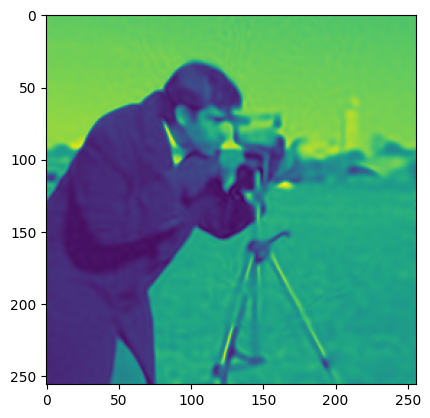

Step 220, Total loss 0.004162, PSNR=23.806976


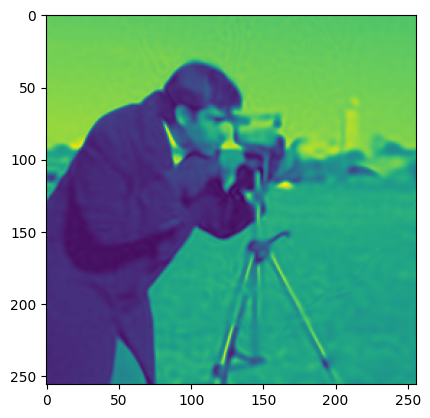

Step 230, Total loss 0.003844, PSNR=24.152042


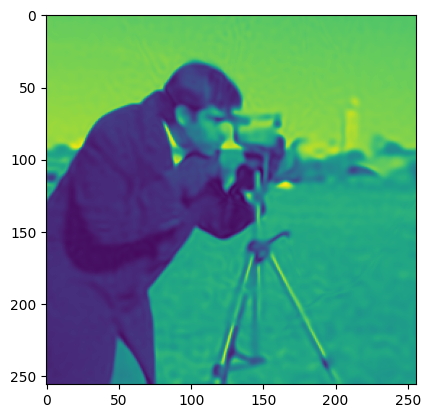

Step 240, Total loss 0.003534, PSNR=24.517181


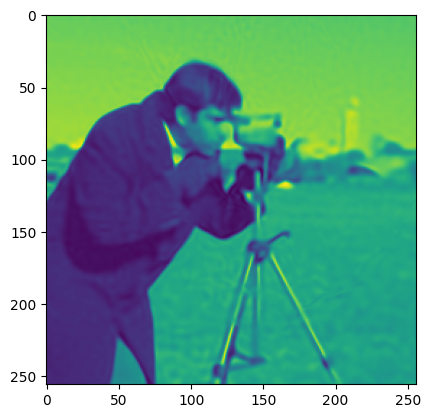

Step 250, Total loss 0.003241, PSNR=24.893072


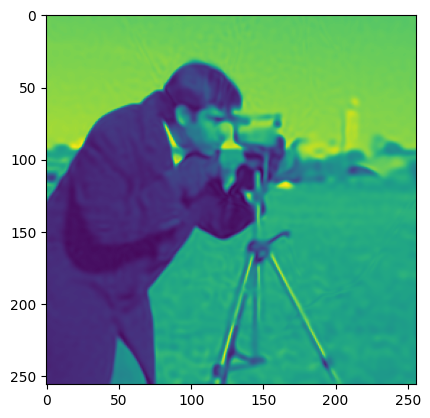

Step 260, Total loss 0.003013, PSNR=25.209417


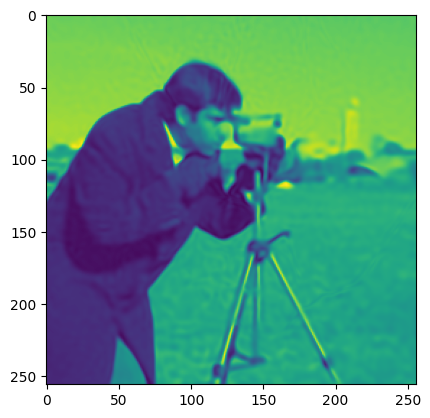

Step 270, Total loss 0.002748, PSNR=25.610142


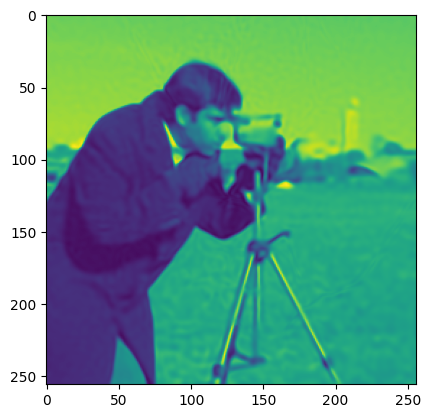

Step 280, Total loss 0.002532, PSNR=25.964661


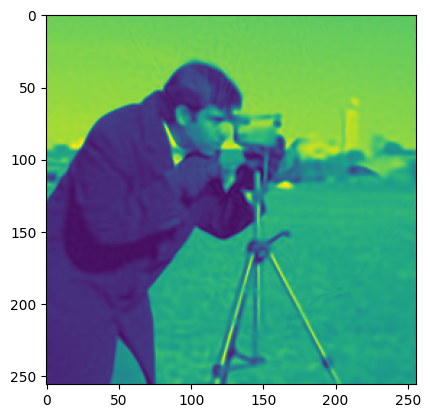

Step 290, Total loss 0.002341, PSNR=26.306150


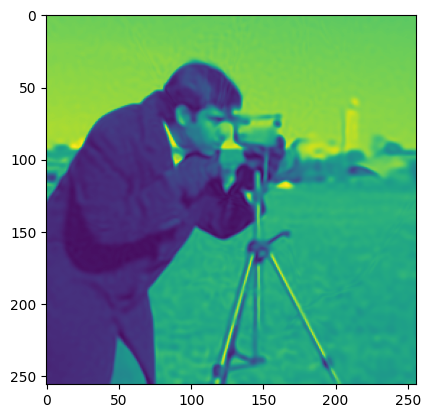

Step 300, Total loss 0.002174, PSNR=26.626909


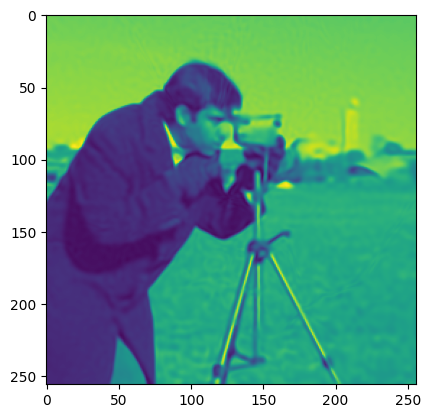

Step 310, Total loss 0.002055, PSNR=26.872299


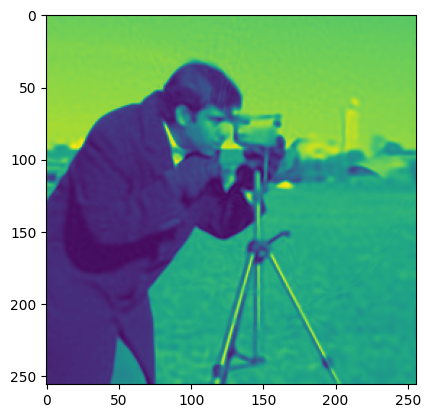

Step 320, Total loss 0.001907, PSNR=27.197454


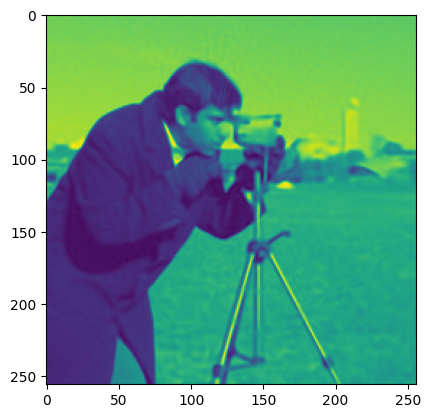

Step 330, Total loss 0.001776, PSNR=27.506216


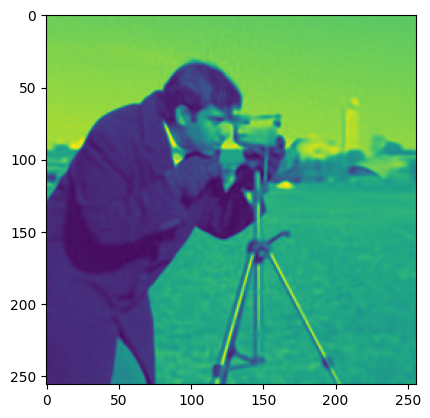

Step 340, Total loss 0.001663, PSNR=27.790567


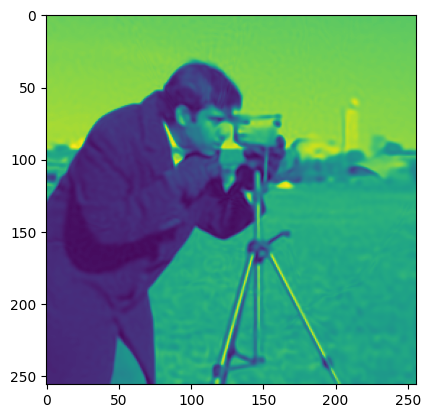

Step 350, Total loss 0.001567, PSNR=28.048971


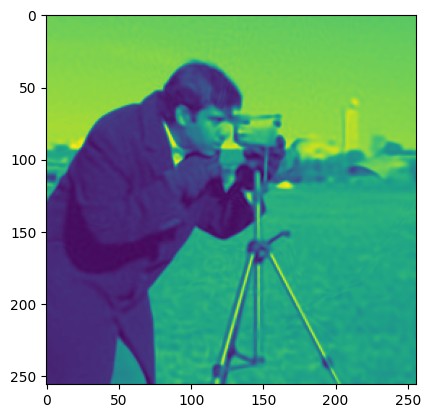

Step 360, Total loss 0.001481, PSNR=28.295328


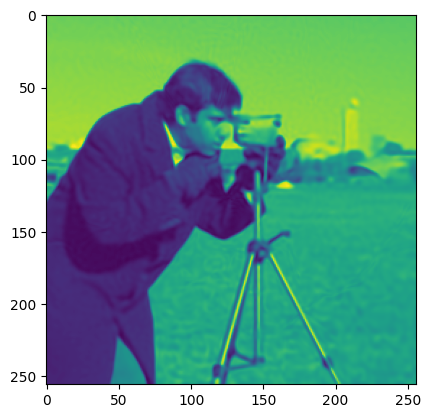

Step 370, Total loss 0.001443, PSNR=28.407917


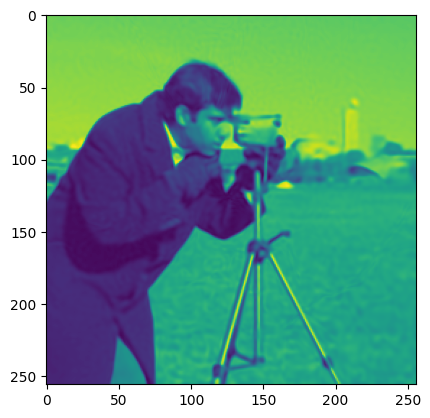

Step 380, Total loss 0.001348, PSNR=28.703344


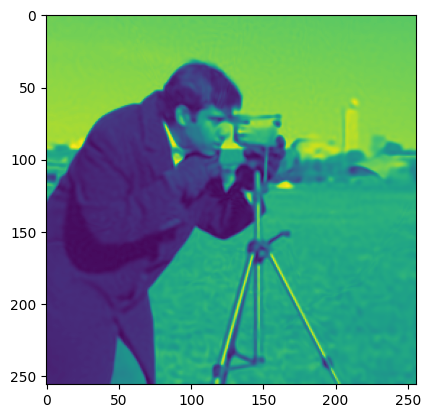

Step 390, Total loss 0.001276, PSNR=28.941010


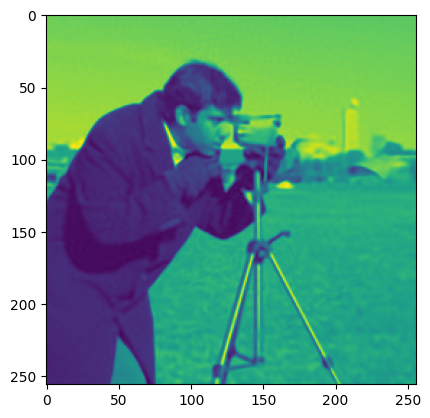

Step 400, Total loss 0.001212, PSNR=29.165075


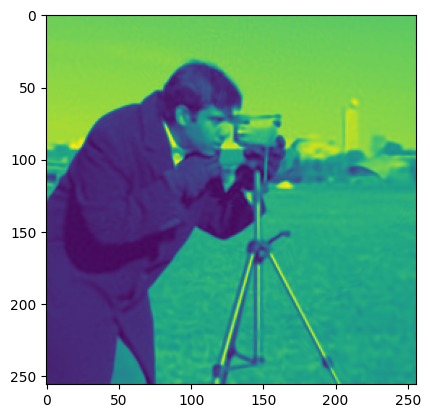

Step 410, Total loss 0.001157, PSNR=29.364880


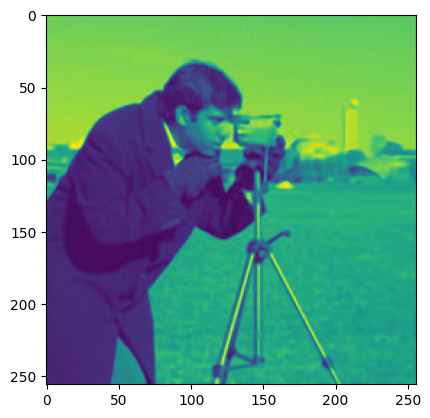

Step 420, Total loss 0.001109, PSNR=29.549603


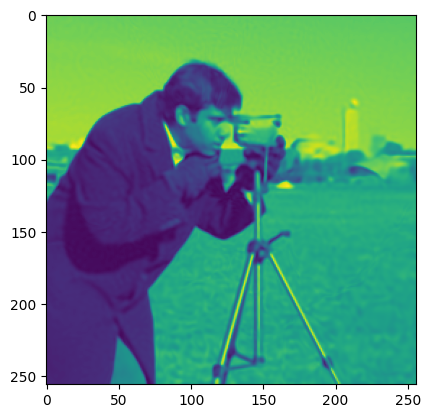

Step 430, Total loss 0.001159, PSNR=29.361000


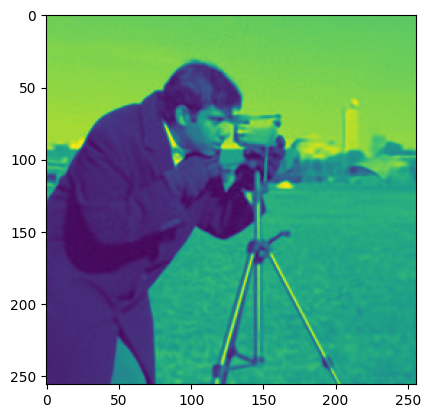

Step 440, Total loss 0.001060, PSNR=29.745533


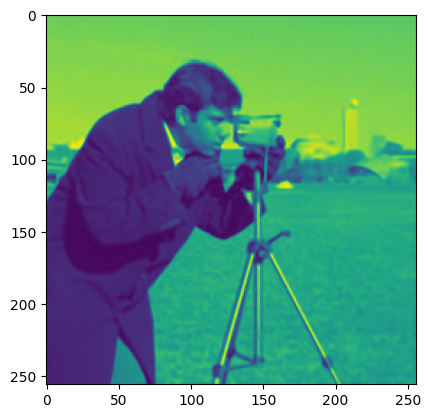

Step 450, Total loss 0.000985, PSNR=30.067003


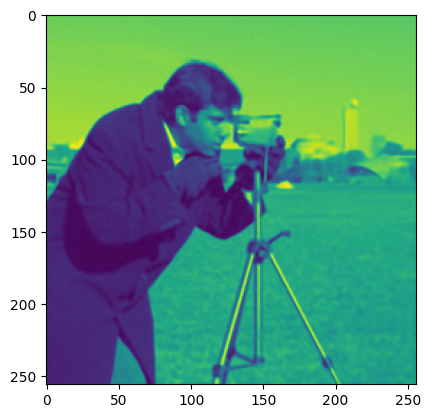

Step 460, Total loss 0.000945, PSNR=30.244055


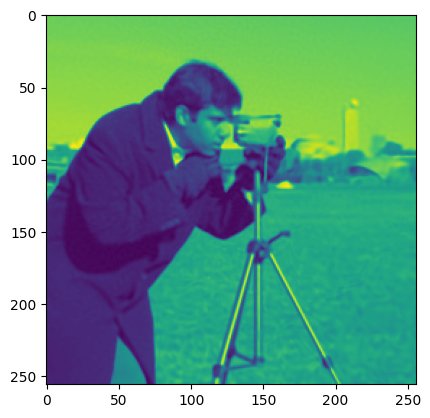

Step 470, Total loss 0.000909, PSNR=30.412079


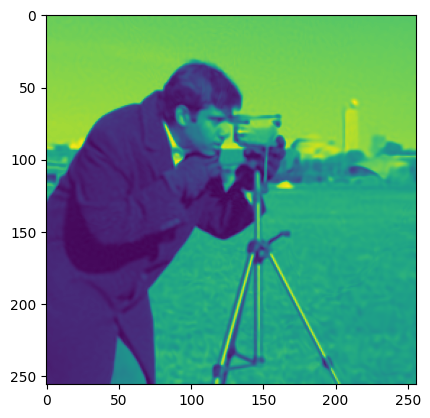

Step 480, Total loss 0.000875, PSNR=30.578957


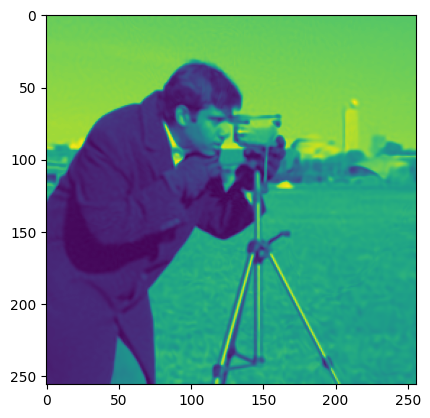

Step 490, Total loss 0.000845, PSNR=30.731667


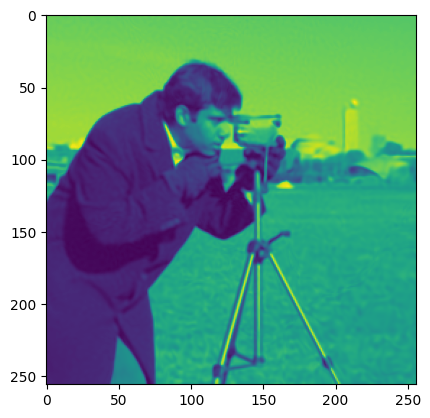

In [15]:
optimizer = torch.optim.Adam(lr=1e-4, params=params)


pbar = tqdm(range(total_steps))
for step in pbar:
    optimizer.zero_grad()
    y_pred = forward(uvs, layers)
    mse, psnr = my_mse_loss(y, y_pred)

    mse.backward()
    optimizer.step()

    pbar.set_description(f'mse={mse:.5f}')
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f, PSNR=%0.6f" % (step, mse, psnr))
        if not step % steps_til_summary*4:
            plt.imshow(y_pred.detach().cpu().reshape(256,256))
            plt.show()

# Visialize statistics

I want snapshot to contain:

- Input distribution
- Distribution after dot product
- Distribution after activation function

I want to look at these snapshots:

- Default init at start
- Good    init at start
- Good    init at the end

## Snapshot creation

In [16]:
layers = [
    linear(in_features, hidden_features),
    *[linear(hidden_features, hidden_features) for _ in range(hidden_layers)],
    linear(hidden_features, out_features)
]

# W, _ = layers[0]
# W.uniform_(-1 / in_features, 1 / in_features)

# for W, _ in layers[1:]:
#     W.uniform_(-np.sqrt(6 / hidden_features) / omega_0, 
#                                              np.sqrt(6 / hidden_features) / omega_0)

params = [p for l in layers for p in l]
for p in params:
    p.requires_grad_(True)

In [17]:
def record_snapshot(layers):
    activations = []
    h = uvs

    activations.append({'name': 'input', 
                        'distribution': uvs.cpu().detach()})

    for i, (W, b) in enumerate(layers):
        h = h@W + b

        activations.append({'name': f'layer_{i}_preact', 
                        'distribution': h.cpu().detach()})

        if i != len(layers) - 1:
            h = (omega_0*h).sin()

            activations.append({'name': f'layer_{i}_act', 
                    'distribution': h.cpu().detach()})

    mse = F.mse_loss(h, y)
    mse.backward()



    grads = []
    for i, (W, b) in enumerate(layers):
        h,w = W.shape
        grads.append({'name': f'W_{i}_grad {h:03}x{w:03}', 
                    'distribution': W.grad.cpu().detach()})
        
    return activations, grads

In [18]:
activations, grads = record_snapshot(layers)

In [19]:
# for act in activations:
#     name = act['name']
#     vw = 42
#     print('#'*vw)
#     print("#"+(' '*(vw//3))+name)
#     print('#'*vw)
    
#     display(act['distribution'].plt)
    
#     print('\n'*3)
    
    

In [20]:
import matplotlib.pyplot as plt

def plot_activations(activations, x_range = (-1.0, 1.0)):
    
    if not hasattr(x_range, '__len__'):
        x_range = (-x_range, x_range)

    n_bins = 50  # Number of bins for histograms

    # Initialize the figure and set the number of subplots
    fig, axes = plt.subplots(ncols=1, nrows=len(activations), figsize=(8, 20))

    for idx, activation in enumerate(activations):
        data = activation["distribution"].flatten().numpy()  # Convert tensor to numpy array
        ax = axes[idx]  # Get the corresponding axis

        # activation["distribution"].plt(center="mean", ax=ax)
        # Plot histogram for the activation
        ax.hist(data, bins=n_bins)
        ax.set_title(activation["name"])
        # ax.set_xlim(x_range)

    # Adjust spacing between subplots
    plt.subplots_adjust(hspace=0.8)
    plt.show()

In [21]:
# plot_activations(grads)

In [22]:
# plot_activations(activations)

In [23]:
def vis_snapshot(snapshot, title='some title', show=True, outfile=None):
    activations, grads = snapshot
    # if not hasattr(x_range, '__len__'):
    #     x_range = (-x_range, x_range)

    n_bins = 50  # Number of bins for histograms

    # Initialize the figure and set the number of subplots
    fig, axes = plt.subplots(ncols=2, nrows=len(activations), figsize=(12, 32))

    # Set the global title for the figure
    fig.suptitle(title, fontsize=16, y=0.91)

    grad_idx = 0
    for idx, activation in enumerate(activations):
        data = activation["distribution"].flatten().numpy()  # Convert tensor to numpy array
        axes_row = axes[idx]
        ax = axes_row[0]  # Get the corresponding axis

        # activation["distribution"].plt(center="mean", ax=ax)
        # Plot histogram for the activation
        ax.hist(data, bins=n_bins)
        ax.set_title(activation["name"])

        if '_preact' in activation["name"]:
            g = grads[grad_idx]
            data = g["distribution"].flatten().numpy()
            ax = axes_row[1]
            ax.hist(data, bins=n_bins)
            ax.set_title(g["name"])

            grad_idx += 1

        # ax.set_xlim(x_range)

    # Adjust spacing between subplots
    plt.subplots_adjust(hspace=0.8)

    if outfile is not None:
        plt.savefig(str(outfile), dpi=300, bbox_inches="tight")

    if show:
        plt.show()

In [24]:
def proper_paper_init(layers):    
    W, _ = layers[0]
    W.uniform_(-1 / in_features, 1 / in_features)

    for W, _ in layers[1:]:
        W.uniform_(-np.sqrt(6 / hidden_features) / omega_0, 
                                                 np.sqrt(6 / hidden_features) / omega_0)

## Grad std trajectories

In [25]:
# LOG_DIR = VIS_DIR/'siren_convergence'
# LOG_DIR.mkdir(exist_ok=True)

$\sigma$ 

In [26]:
def karpathy_plot_gradients(layers, title='gradient distribution'):
    plt.figure(figsize=(20, 4)) # width and height of the plot
    legends = []

    for i, (W, b) in enumerate(layers):
        G = W.grad.detach().cpu()
        gd = G.std() / W.std().cpu()

        ratio = W.norm() / G.norm()

        name = f'layer_{i} {W.shape[0]:03}x{W.shape[1]:03}'
        print(f'{name} | grad 𝜇={G.mean():+.4e} | 𝜎={G.std():.4e} | grad:data ratio {gd:.4e} | w2g ratio {ratio:.4e}')

        hy, hx = torch.histogram(G, density=True)
        plt.plot(hx[:-1].detach(), hy.detach())
        legends.append(name)

    plt.legend(legends);
    plt.title(title)
    plt.show()

W0 tensor[2, 256] n=512 x∈[-2.783, 3.172] μ=-0.070 σ=0.983 cuda:0
W1 tensor[256, 256] n=65536 x∈[-4.056, 3.956] μ=-0.000 σ=1.004 cuda:0
W2 tensor[256, 256] n=65536 x∈[-4.028, 4.380] μ=-0.005 σ=1.002 cuda:0
W3 tensor[256, 256] n=65536 x∈[-3.810, 4.382] μ=-0.002 σ=0.998 cuda:0
W4 tensor[256, 1] x∈[-2.494, 3.497] μ=-0.066 σ=1.005 cuda:0
########## 

layer_0_act tensor[1, 65536, 256] n=16777216 x∈[-1.000, 1.000] μ=-1.257e-06 σ=0.706
layer_1_act tensor[1, 65536, 256] n=16777216 x∈[-1.000, 1.000] μ=7.186e-05 σ=0.707
layer_2_act tensor[1, 65536, 256] n=16777216 x∈[-1.000, 1.000] μ=0.000 σ=0.707
layer_3_act tensor[1, 65536, 256] n=16777216 x∈[-1.000, 1.000] μ=-0.000 σ=0.707

layer_0 002x256 | grad 𝜇=-1.5068e+06 | 𝜎=4.4042e+07 | grad:data ratio 4.4791e+07 | w2g ratio 2.2369e-08
layer_1 256x256 | grad 𝜇=+3.7186e+02 | 𝜎=1.5603e+05 | grad:data ratio 1.5543e+05 | w2g ratio 6.4336e-06
layer_2 256x256 | grad 𝜇=+1.4398e+00 | 𝜎=4.5882e+02 | grad:data ratio 4.5779e+02 | w2g ratio 2.1844e-03
layer_3 256x

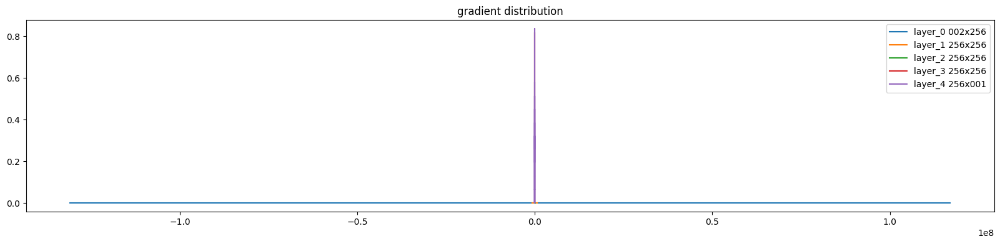

In [27]:
layers = [
    linear(in_features, hidden_features),
    *[linear(hidden_features, hidden_features) for _ in range(hidden_layers)],
    linear(hidden_features, out_features)
]

# proper_paper_init(layers)

for i, (W, b) in enumerate(layers):
    print(f'W{i}', W)
    # print(f'b{i}', b)

print('#'*10, '\n')
params = [p for l in layers for p in l]
for p in params:
    p.requires_grad_(True)
    
    
activations, grads = record_snapshot(layers)

for a in activations:
    name, d = a['name'], a['distribution']
    
    if '_act' in name:
        print(name, d)
        
print()
karpathy_plot_gradients(layers)

W0 tensor[2, 256] n=512 x∈[-0.492, 0.497] μ=0.022 σ=0.297 cuda:0
W1 tensor[256, 256] n=65536 x∈[-0.005, 0.005] μ=-1.149e-05 σ=0.003 cuda:0
W2 tensor[256, 256] n=65536 x∈[-0.005, 0.005] μ=6.153e-06 σ=0.003 cuda:0
W3 tensor[256, 256] n=65536 x∈[-0.005, 0.005] μ=-3.762e-06 σ=0.003 cuda:0
W4 tensor[256, 1] x∈[-0.005, 0.005] μ=0.000 σ=0.003 cuda:0
########## 

layer_0_act tensor[1, 65536, 256] n=16777216 x∈[-1.000, 1.000] μ=-9.456e-06 σ=0.707
layer_1_act tensor[1, 65536, 256] n=16777216 x∈[-1.000, 1.000] μ=-0.000 σ=0.659
layer_2_act tensor[1, 65536, 256] n=16777216 x∈[-1.000, 1.000] μ=-3.100e-05 σ=0.643
layer_3_act tensor[1, 65536, 256] n=16777216 x∈[-1.000, 1.000] μ=-0.000 σ=0.637

layer_0 002x256 | grad 𝜇=+8.5243e-05 | 𝜎=3.8720e-03 | grad:data ratio 1.3055e-02 | w2g ratio 7.6794e+01
layer_1 256x256 | grad 𝜇=+9.7475e-06 | 𝜎=4.8059e-03 | grad:data ratio 1.6290e+00 | w2g ratio 6.1386e-01
layer_2 256x256 | grad 𝜇=-2.0307e-05 | 𝜎=4.8301e-03 | grad:data ratio 1.6407e+00 | w2g ratio 6.0949e-01
l

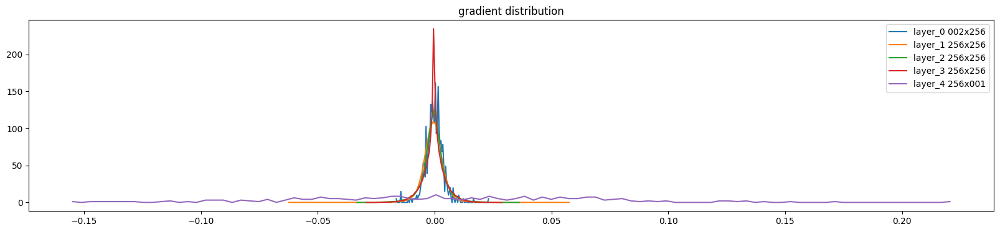

In [28]:
layers = [
    linear(in_features, hidden_features),
    *[linear(hidden_features, hidden_features) for _ in range(hidden_layers)],
    linear(hidden_features, out_features)
]

proper_paper_init(layers)

for i, (W, b) in enumerate(layers):
    print(f'W{i}', W)
    # print(f'b{i}', b)

print('#'*10, '\n')
params = [p for l in layers for p in l]
for p in params:
    p.requires_grad_(True)
    
    
activations, grads = record_snapshot(layers)

for a in activations:
    name, d = a['name'], a['distribution']
    
    if '_act' in name:
        print(name, d)
        
print()
karpathy_plot_gradients(layers)

### default init trajectories 

  0%|          | 0/500 [00:00<?, ?it/s]

layer_0 002x256 | grad 𝜇=-2.5316e+06 | 𝜎=3.7453e+07 | grad:data ratio 3.6420e+07 | w2g ratio 2.7416e-08
layer_1 256x256 | grad 𝜇=+5.6948e+02 | 𝜎=1.3841e+05 | grad:data ratio 1.3851e+05 | w2g ratio 7.2196e-06
layer_2 256x256 | grad 𝜇=+2.7630e-01 | 𝜎=4.1167e+02 | grad:data ratio 4.1294e+02 | w2g ratio 2.4218e-03
layer_3 256x256 | grad 𝜇=+5.8540e-03 | 𝜎=1.2114e+00 | grad:data ratio 1.2104e+00 | w2g ratio 8.2614e-01
layer_4 256x001 | grad 𝜇=+8.3360e-03 | 𝜎=9.6182e-01 | grad:data ratio 1.0052e+00 | w2g ratio 9.9483e-01


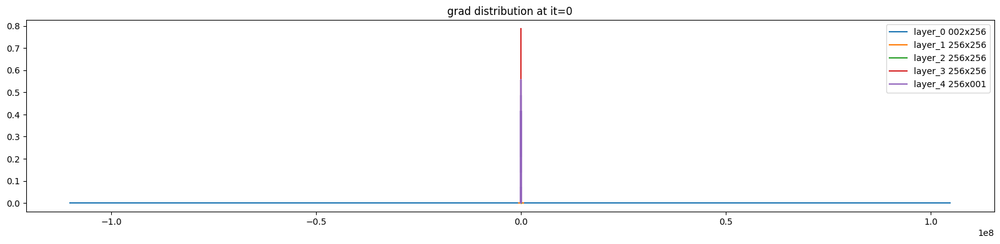

Step 0, Total loss 117.452545, PSNR=-20.698626
Step 10, Total loss 115.369720, PSNR=-20.620918
Step 20, Total loss 117.595078, PSNR=-20.703892
Step 30, Total loss 116.295753, PSNR=-20.655640
Step 40, Total loss 116.511856, PSNR=-20.663702
layer_0 002x256 | grad 𝜇=+1.2801e+06 | 𝜎=3.7044e+07 | grad:data ratio 3.6023e+07 | w2g ratio 2.7765e-08
layer_1 256x256 | grad 𝜇=-1.0853e+03 | 𝜎=1.3733e+05 | grad:data ratio 1.3744e+05 | w2g ratio 7.2759e-06
layer_2 256x256 | grad 𝜇=+1.1167e+00 | 𝜎=4.0913e+02 | grad:data ratio 4.1041e+02 | w2g ratio 2.4367e-03
layer_3 256x256 | grad 𝜇=+1.1450e-02 | 𝜎=1.2038e+00 | grad:data ratio 1.2029e+00 | w2g ratio 8.3128e-01
layer_4 256x001 | grad 𝜇=+9.2198e-03 | 𝜎=9.6345e-01 | grad:data ratio 1.0112e+00 | w2g ratio 9.8891e-01


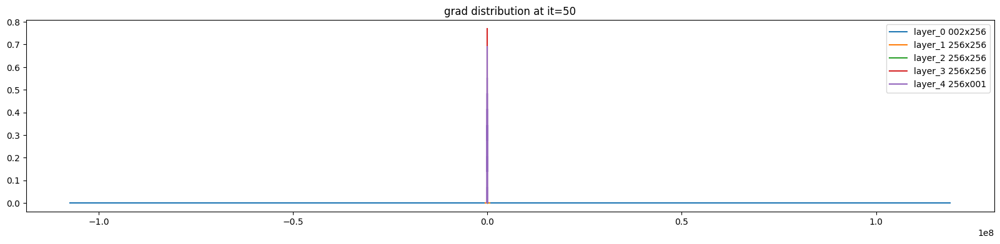

Step 50, Total loss 117.115189, PSNR=-20.686132
Step 60, Total loss 115.589890, PSNR=-20.629198
Step 70, Total loss 114.224586, PSNR=-20.577595
Step 80, Total loss 114.965820, PSNR=-20.605688
Step 90, Total loss 114.850822, PSNR=-20.601341
Step 100, Total loss 114.913467, PSNR=-20.603710
Step 110, Total loss 115.224045, PSNR=-20.615433
Step 120, Total loss 113.673904, PSNR=-20.556606
Step 130, Total loss 114.267822, PSNR=-20.579241
Step 140, Total loss 114.311737, PSNR=-20.580910
Step 150, Total loss 113.373962, PSNR=-20.545135
Step 160, Total loss 114.152718, PSNR=-20.574863
Step 170, Total loss 114.298088, PSNR=-20.580391
Step 180, Total loss 113.732910, PSNR=-20.558863
Step 190, Total loss 113.604492, PSNR=-20.553955
Step 200, Total loss 114.183960, PSNR=-20.576054
Step 210, Total loss 112.485580, PSNR=-20.510969
Step 220, Total loss 111.888763, PSNR=-20.487864
Step 230, Total loss 113.000061, PSNR=-20.530787
Step 240, Total loss 113.102554, PSNR=-20.534725
layer_0 002x256 | grad 𝜇=

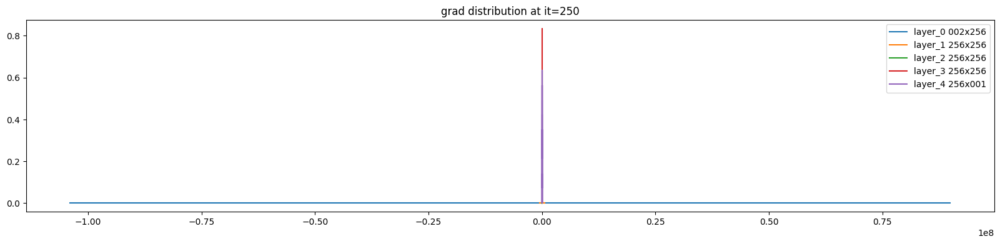

Step 250, Total loss 113.018364, PSNR=-20.531492
Step 260, Total loss 111.160698, PSNR=-20.459515
Step 270, Total loss 110.951416, PSNR=-20.451328
Step 280, Total loss 112.392792, PSNR=-20.507383
Step 290, Total loss 111.183395, PSNR=-20.460400
Step 300, Total loss 111.428558, PSNR=-20.469967
Step 310, Total loss 111.097366, PSNR=-20.457037
Step 320, Total loss 111.789131, PSNR=-20.483997
Step 330, Total loss 110.431656, PSNR=-20.430937
Step 340, Total loss 111.405472, PSNR=-20.469065
Step 350, Total loss 109.546761, PSNR=-20.395996
Step 360, Total loss 110.307907, PSNR=-20.426067
Step 370, Total loss 109.517563, PSNR=-20.394838
Step 380, Total loss 108.890984, PSNR=-20.369919
Step 390, Total loss 111.425331, PSNR=-20.469839
Step 400, Total loss 109.491547, PSNR=-20.393808
Step 410, Total loss 109.476135, PSNR=-20.393196
Step 420, Total loss 108.522392, PSNR=-20.355194
Step 430, Total loss 109.241600, PSNR=-20.383883
Step 440, Total loss 108.148186, PSNR=-20.340193
layer_0 002x256 | gr

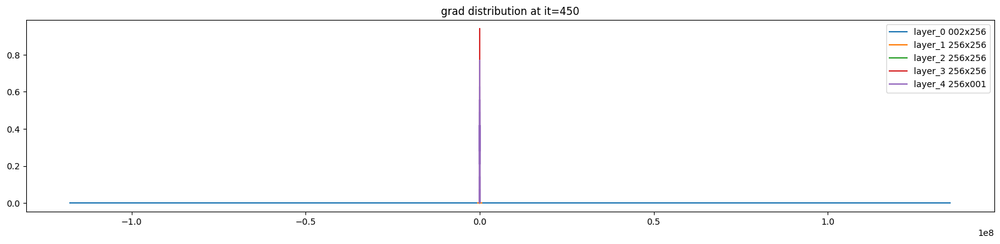

Step 450, Total loss 108.531654, PSNR=-20.355564
Step 460, Total loss 107.525566, PSNR=-20.315117
Step 470, Total loss 107.942368, PSNR=-20.331921
Step 480, Total loss 107.849106, PSNR=-20.328167
Step 490, Total loss 108.733772, PSNR=-20.363646


In [29]:
log_freq = 1


layers = [
    linear(in_features, hidden_features),
    *[linear(hidden_features, hidden_features) for _ in range(hidden_layers)],
    linear(hidden_features, out_features)
]

# proper_paper_init(layers)

params = [p for l in layers for p in l]
for p in params:
    p.requires_grad_(True)

optimizer = torch.optim.AdamW(lr=1e-4, params=params)

layer_stds = {i: [] for i in range(len(layers))}
layer_w2g = {i: [] for i in range(len(layers))}


pbar = tqdm(range(total_steps))
for step in pbar:
    optimizer.zero_grad()
    y_pred = forward(uvs, layers)
    mse, psnr = my_mse_loss(y, y_pred)

    mse.backward()
    optimizer.step()

    pbar.set_description(f'mse={mse:.5f} psnr={psnr:.3f}')
    
    if step in [0, 50, 250, 450]:
        karpathy_plot_gradients(layers, title=f'grad distribution at it={step}')
        
    for i, (W, b) in enumerate(layers):
        layer_w2g[i].append(  (W.norm() / W.grad.norm()).item()  )
        layer_stds[i].append(W.std().item())
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f, PSNR=%0.6f" % (step, mse, psnr))

        # if not step % steps_til_summary*4:
        #     plt.imshow(y_pred.detach().cpu().reshape(256,256))
        #     plt.show()

In [32]:
title='default init'

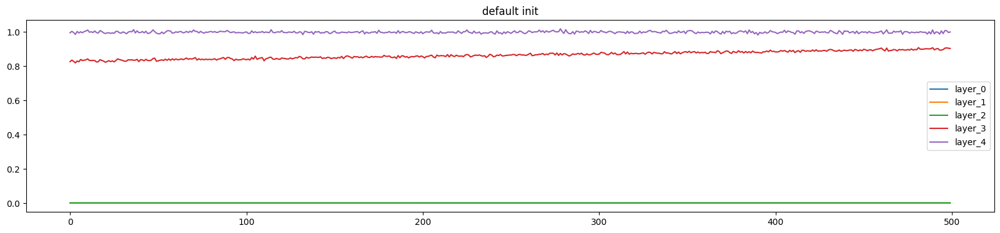

In [33]:
plt.figure(figsize=(20, 4)) # width and height of the plot
legends = []

for i, w2g in layer_w2g.items():
    name = f'layer_{i}'

    plt.plot(w2g)
    legends.append(name)

plt.legend(legends);
plt.title(title)
plt.show()

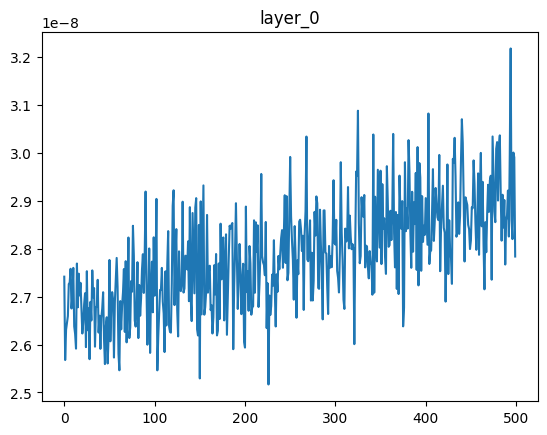

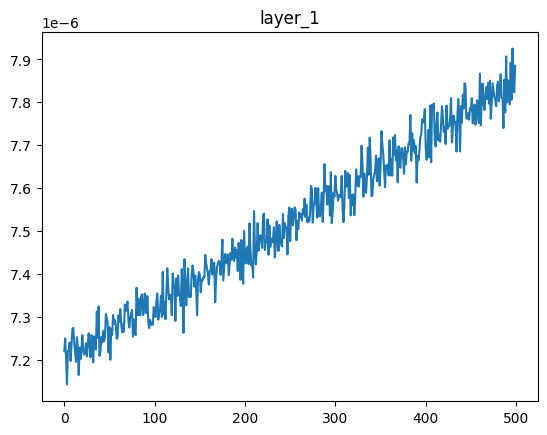

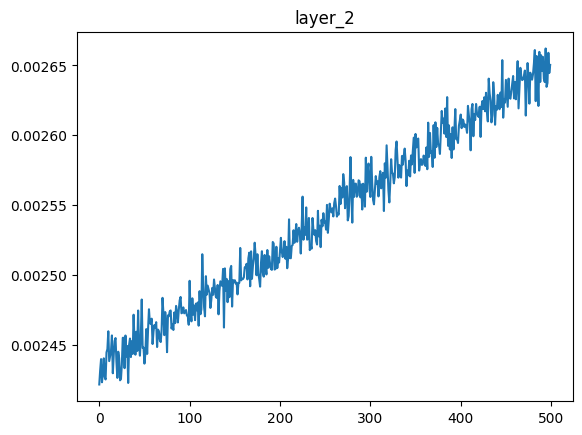

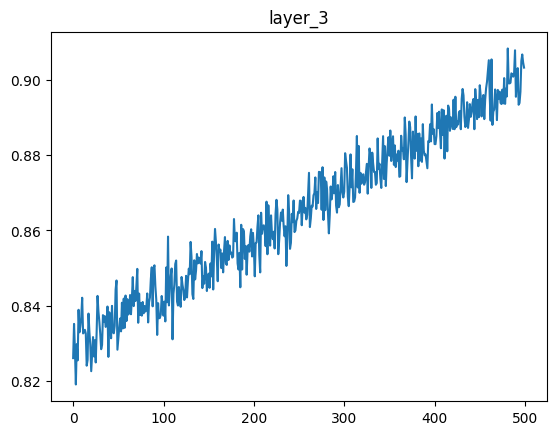

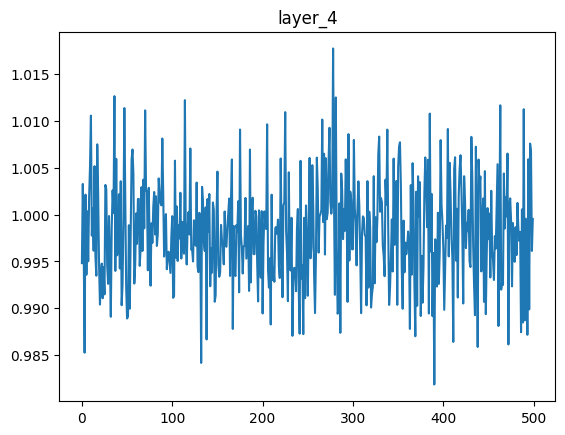

In [34]:
for i, w2g in layer_w2g.items():
    name = f'layer_{i}'

    plt.plot(w2g)

    plt.title(name)
    plt.show()

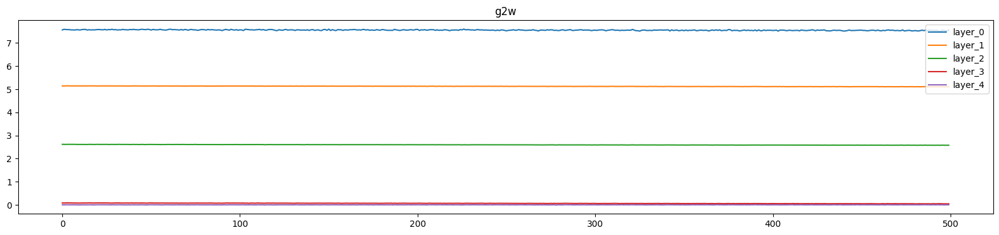

In [35]:
plt.figure(figsize=(20, 4)) # width and height of the plot
legends = []

for i, w2g in layer_w2g.items():
    name = f'layer_{i}'
    
    y_plot = np.log10(1/np.array(w2g))
    plt.plot(y_plot)
    legends.append(name)

plt.legend(legends);
plt.title("g2w")
plt.show()

In [30]:
break

SyntaxError: 'break' outside loop (668683560.py, line 4)

### well init trajectories

  0%|          | 0/500 [00:00<?, ?it/s]

layer_0 002x256 | grad 𝜇=+2.8008e-05 | 𝜎=5.4475e-03 | grad:data ratio 1.9738e-02 | w2g ratio 5.0708e+01
layer_1 256x256 | grad 𝜇=+5.6137e-06 | 𝜎=6.5036e-03 | grad:data ratio 2.2091e+00 | w2g ratio 4.5268e-01
layer_2 256x256 | grad 𝜇=-1.5740e-05 | 𝜎=5.8924e-03 | grad:data ratio 2.0047e+00 | w2g ratio 4.9884e-01
layer_3 256x256 | grad 𝜇=-8.6609e-08 | 𝜎=5.3423e-03 | grad:data ratio 1.8197e+00 | w2g ratio 5.4954e-01
layer_4 256x001 | grad 𝜇=+9.8579e-04 | 𝜎=8.4053e-02 | grad:data ratio 2.9277e+01 | w2g ratio 3.4468e-02


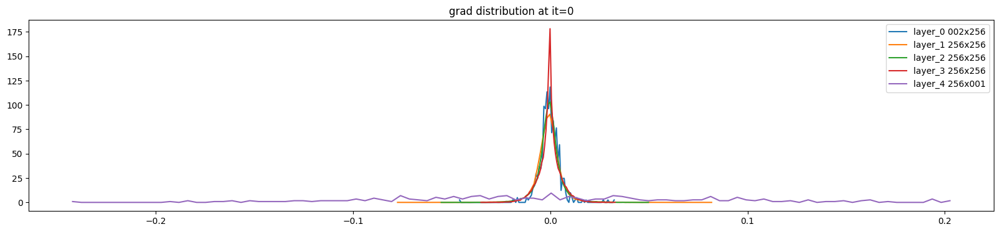

Step 0, Total loss 0.330566, PSNR=4.807418
Step 10, Total loss 0.113992, PSNR=9.431258
Step 20, Total loss 0.061291, PSNR=12.126017
Step 30, Total loss 0.032095, PSNR=14.935602
Step 40, Total loss 0.020475, PSNR=16.887836
layer_0 002x256 | grad 𝜇=-8.2374e-05 | 𝜎=1.0427e-03 | grad:data ratio 3.7790e-03 | w2g ratio 2.6402e+02
layer_1 256x256 | grad 𝜇=-4.2048e-06 | 𝜎=7.3384e-04 | grad:data ratio 2.3877e-01 | w2g ratio 4.1882e+00
layer_2 256x256 | grad 𝜇=+1.7654e-06 | 𝜎=3.7213e-04 | grad:data ratio 1.2074e-01 | w2g ratio 8.2825e+00
layer_3 256x256 | grad 𝜇=-1.7353e-07 | 𝜎=1.6350e-04 | grad:data ratio 5.3007e-02 | w2g ratio 1.8865e+01
layer_4 256x001 | grad 𝜇=+3.3407e-04 | 𝜎=3.4444e-03 | grad:data ratio 7.2051e-01 | w2g ratio 1.3930e+00


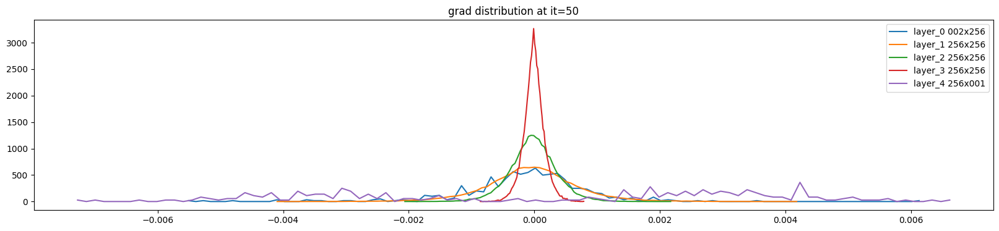

Step 50, Total loss 0.015877, PSNR=17.992216
Step 60, Total loss 0.013380, PSNR=18.735403
Step 70, Total loss 0.011898, PSNR=19.245377
Step 80, Total loss 0.010848, PSNR=19.646374
Step 90, Total loss 0.010039, PSNR=19.983246
Step 100, Total loss 0.009368, PSNR=20.283592
Step 110, Total loss 0.008779, PSNR=20.565304
Step 120, Total loss 0.008247, PSNR=20.837067
Step 130, Total loss 0.007759, PSNR=21.102074
Step 140, Total loss 0.007304, PSNR=21.364624
Step 150, Total loss 0.006869, PSNR=21.630756
Step 160, Total loss 0.006449, PSNR=21.904852
Step 170, Total loss 0.006040, PSNR=22.189701
Step 180, Total loss 0.005640, PSNR=22.487507
Step 190, Total loss 0.005248, PSNR=22.799744
Step 200, Total loss 0.004871, PSNR=23.124165
Step 210, Total loss 0.004582, PSNR=23.389160
Step 220, Total loss 0.004253, PSNR=23.712910
Step 230, Total loss 0.003895, PSNR=24.095306
Step 240, Total loss 0.003587, PSNR=24.453257
layer_0 002x256 | grad 𝜇=+2.0017e-05 | 𝜎=2.1101e-04 | grad:data ratio 7.6390e-04 | w2

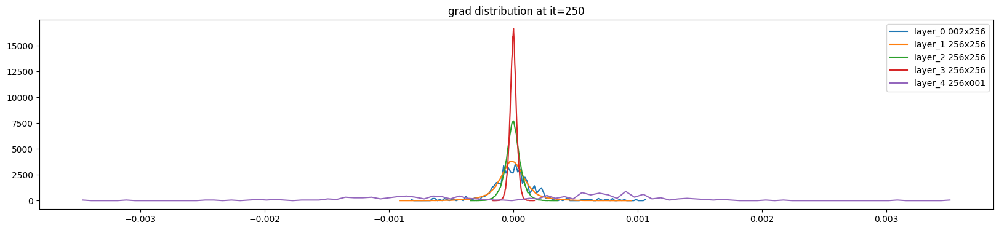

Step 250, Total loss 0.003311, PSNR=24.800528
Step 260, Total loss 0.003061, PSNR=25.141506
Step 270, Total loss 0.002834, PSNR=25.476435
Step 280, Total loss 0.002658, PSNR=25.754843
Step 290, Total loss 0.002450, PSNR=26.108273
Step 300, Total loss 0.002273, PSNR=26.434105
Step 310, Total loss 0.002119, PSNR=26.739464
Step 320, Total loss 0.001980, PSNR=27.033863
Step 330, Total loss 0.001857, PSNR=27.312309
Step 340, Total loss 0.001815, PSNR=27.410471
Step 350, Total loss 0.001661, PSNR=27.796986
Step 360, Total loss 0.001557, PSNR=28.077850
Step 370, Total loss 0.001477, PSNR=28.305401
Step 380, Total loss 0.001404, PSNR=28.525629
Step 390, Total loss 0.001348, PSNR=28.702871
Step 400, Total loss 0.001292, PSNR=28.887180
Step 410, Total loss 0.001234, PSNR=29.086420
Step 420, Total loss 0.001180, PSNR=29.280151
Step 430, Total loss 0.001134, PSNR=29.452780
Step 440, Total loss 0.001092, PSNR=29.616978
layer_0 002x256 | grad 𝜇=-6.7269e-07 | 𝜎=4.4356e-05 | grad:data ratio 1.6050e-04

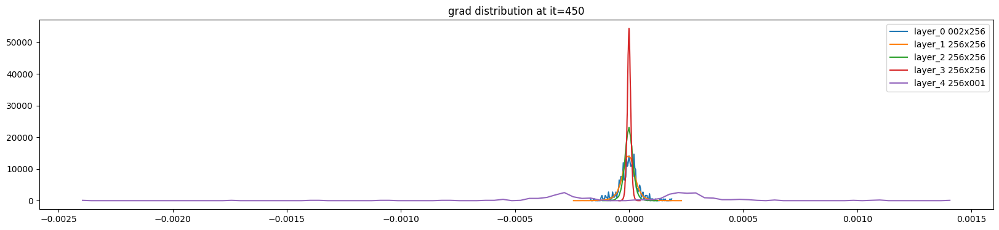

Step 450, Total loss 0.001053, PSNR=29.776459
Step 460, Total loss 0.001016, PSNR=29.930252
Step 470, Total loss 0.001013, PSNR=29.944704
Step 480, Total loss 0.000979, PSNR=30.094139
Step 490, Total loss 0.000925, PSNR=30.340355


In [36]:
log_freq = 1


layers = [
    linear(in_features, hidden_features),
    *[linear(hidden_features, hidden_features) for _ in range(hidden_layers)],
    linear(hidden_features, out_features)
]

proper_paper_init(layers)

params = [p for l in layers for p in l]
for p in params:
    p.requires_grad_(True)

optimizer = torch.optim.AdamW(lr=1e-4, params=params)

layer_stds = {i: [] for i in range(len(layers))}
layer_w2g = {i: [] for i in range(len(layers))}


pbar = tqdm(range(total_steps))
for step in pbar:
    optimizer.zero_grad()
    y_pred = forward(uvs, layers)
    mse, psnr = my_mse_loss(y, y_pred)

    mse.backward()
    optimizer.step()

    pbar.set_description(f'mse={mse:.5f} psnr={psnr:.3f}')
    
    if step in [0, 50, 250, 450]:
        karpathy_plot_gradients(layers, title=f'grad distribution at it={step}')
        
    for i, (W, b) in enumerate(layers):
        layer_w2g[i].append(  (W.norm() / W.grad.norm()).item()  )
        layer_stds[i].append(W.std().item())
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f, PSNR=%0.6f" % (step, mse, psnr))

        # if not step % steps_til_summary*4:
        #     plt.imshow(y_pred.detach().cpu().reshape(256,256))
        #     plt.show()

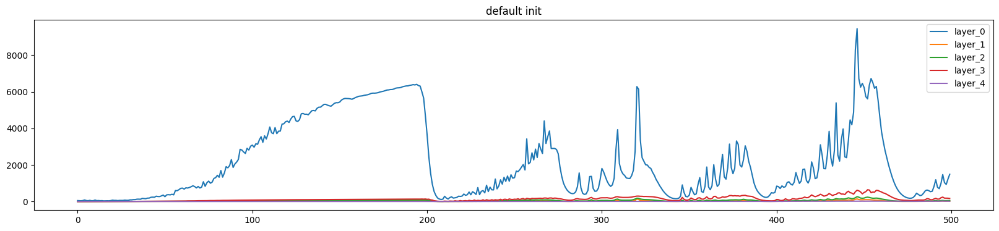

In [37]:
plt.figure(figsize=(20, 4)) # width and height of the plot
legends = []

for i, w2g in layer_w2g.items():
    name = f'layer_{i}'

    plt.plot(w2g)
    legends.append(name)

plt.legend(legends);
plt.title(title)
plt.show()

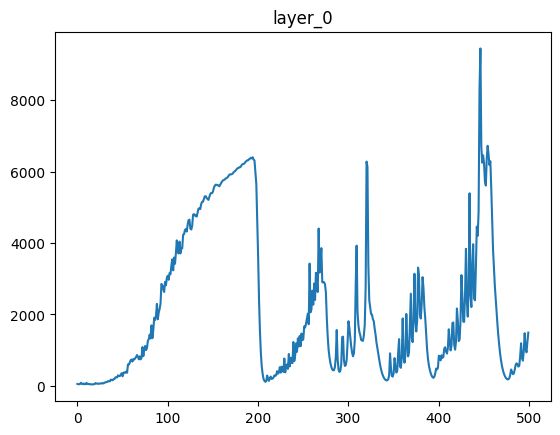

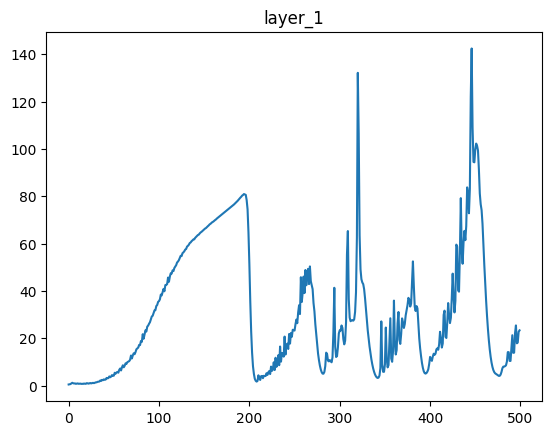

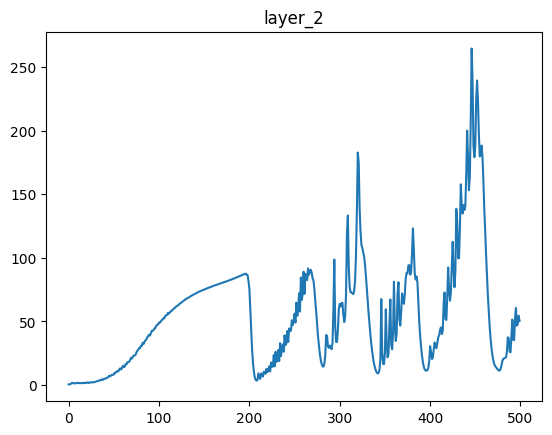

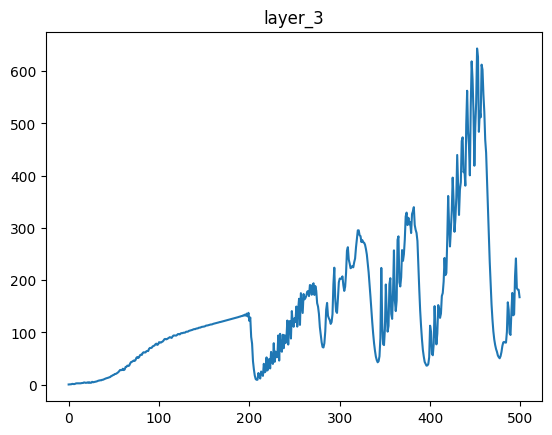

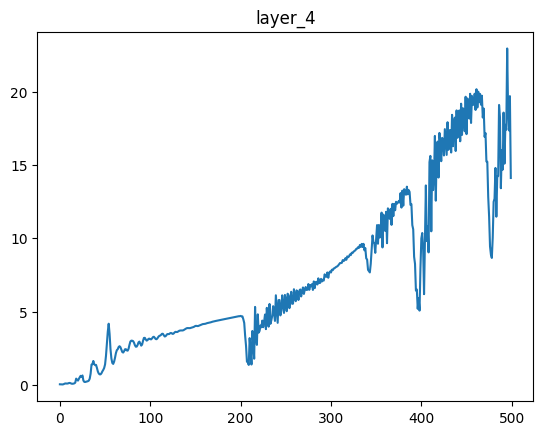

In [38]:
for i, w2g in layer_w2g.items():
    name = f'layer_{i}'

    plt.plot(w2g)

    plt.title(name)
    plt.show()

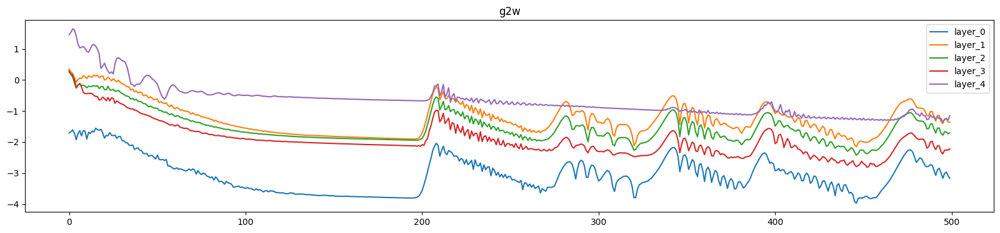

In [39]:
plt.figure(figsize=(20, 4)) # width and height of the plot
legends = []

for i, w2g in layer_w2g.items():
    name = f'layer_{i}'
    
    y_plot = np.log10(1/np.array(w2g))
    plt.plot(y_plot)
    legends.append(name)

plt.legend(legends);
plt.title("g2w")
plt.show()

In [ ]:
import matplotlib.pyplot as plt

# create a figure and axis object
fig, ax = plt.subplots()

# iterate through the dictionary and plot the stds for each layer
for layer, stds in layer_stds.items():
    if layer == 0:
        continue
    ax.plot(stds, label=f"Layer {layer}")

# set labels and title for the plot
ax.set_xlabel("Epoch")
ax.set_ylabel("Standard Deviation")
ax.set_title("Standard Deviation for each Layer")

# add legend to the plot
ax.legend()

# display the plot
plt.show()


In [ ]:
break

## Save snapshot

In [ ]:
from pathlib import Path

In [ ]:
VIS_DIR = Path('./vis_artifacts')
VIS_DIR.mkdir(exist_ok=True)

### Default init

In [ ]:
layers = [
    linear(in_features, hidden_features),
    *[linear(hidden_features, hidden_features) for _ in range(hidden_layers)],
    linear(hidden_features, out_features)
]

# W, _ = layers[0]
# W.uniform_(-1 / in_features, 1 / in_features)

# for W, _ in layers[1:]:
#     W.uniform_(-np.sqrt(6 / hidden_features) / omega_0, 
#                                              np.sqrt(6 / hidden_features) / omega_0)

params = [p for l in layers for p in l]
for p in params:
    p.requires_grad_(True)

In [ ]:
snapshot = record_snapshot(layers)
vis_snapshot(snapshot, title='randn init', outfile=VIS_DIR/'randn_init.png')

### Paper init

In [ ]:
layers = [
    linear(in_features, hidden_features),
    *[linear(hidden_features, hidden_features) for _ in range(hidden_layers)],
    linear(hidden_features, out_features)
]

W, _ = layers[0]
W.uniform_(-1 / in_features, 1 / in_features)

for W, _ in layers[1:]:
    W.uniform_(-np.sqrt(6 / hidden_features) / omega_0, 
                                             np.sqrt(6 / hidden_features) / omega_0)

params = [p for l in layers for p in l]
for p in params:
    p.requires_grad_(True)

In [ ]:
snapshot = record_snapshot(layers)
vis_snapshot(snapshot, title='paper init', outfile=VIS_DIR/'paper_init.png')

### Converged net

In [ ]:
log_freq = 1
LOG_DIR = VIS_DIR/'siren_convergence'
LOG_DIR.mkdir(exist_ok=True)

layers = [
    linear(in_features, hidden_features),
    *[linear(hidden_features, hidden_features) for _ in range(hidden_layers)],
    linear(hidden_features, out_features)
]

W, _ = layers[0]
W.uniform_(-1 / in_features, 1 / in_features)

for W, _ in layers[1:]:
    W.uniform_(-np.sqrt(6 / hidden_features) / omega_0, 
                                             np.sqrt(6 / hidden_features) / omega_0)

params = [p for l in layers for p in l]
for p in params:
    p.requires_grad_(True)

optimizer = torch.optim.Adam(lr=1e-4, params=params)


pbar = tqdm(range(total_steps))
for step in pbar:
    optimizer.zero_grad()
    y_pred = forward(uvs, layers)
    mse, psnr = my_mse_loss(y, y_pred)

    mse.backward()
    optimizer.step()

    pbar.set_description(f'mse={mse:.5f}')
    
    if not step % log_freq:
        snapshot = record_snapshot(layers)
        vis_snapshot(snapshot, title=f'siren it={step:04}', outfile=LOG_DIR/f'{step:04}__siren_snapshot.png', show=False)
    
    if not step % steps_til_summary:
        print("Step %d, Total loss %0.6f, PSNR=%0.6f" % (step, mse, psnr))
        # if not step % steps_til_summary*4:
        #     plt.imshow(y_pred.detach().cpu().reshape(256,256))
        #     plt.show()

In [ ]:
snapshot = record_snapshot(layers)
vis_snapshot(snapshot, title='paper init converged', outfile=VIS_DIR/'paper_init_converged.png')